# Galactic models comparison

In [1]:
from healpy.newvisufunc import projview
from healpy.rotator import Rotator
import healpy as hp
import traceback

import pandas as pd
import numpy as np
from scipy.integrate import quad
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
import itertools

import plotly.graph_objects as go
import plotly.express as px

import os
import sys
from radiocalibrationtoolkit import *

[INFO] LFmap: Import successful.


In [2]:
# This ensures Plotly output works in multiple places:
# plotly_mimetype: VS Code notebook UI
# notebook: "Jupyter: Export to HTML" command in VS Code
# See https://plotly.com/python/renderers/#multiple-renderers
import plotly.io as pio
pio.renderers.default = "plotly_mimetype+notebook"

In [3]:
# some global plot settings
plt.rcParams["axes.titleweight"] = "bold"
plt.rcParams["axes.labelweight"] = "bold"
plt.rcParams["font.weight"] = "bold"
plt.rcParams['font.size'] = 16
plt.rcParams['legend.fontsize']= 14

plt.rcParams['xtick.major.width']= 2
plt.rcParams['ytick.major.width']= 2

plt.rcParams['xtick.major.size']= 5
plt.rcParams['ytick.major.size']= 5

plt.rcParams['xtick.labelsize']= 14
plt.rcParams['ytick.labelsize']= 14

In [4]:
# Prepare objects
lfmap = LFmap()
lfss = LowFrequencySkyModel(freq_unit="MHz")
gsm2008 = GlobalSkyModel(freq_unit="MHz")
gsm2016 = GlobalSkyModel2016(freq_unit="MHz")
haslam = HaslamSkyModel(freq_unit="MHz", spectral_index=-2.53)
ssm = SSM()
gmoss = GMOSS()
ulsa_fdi = ULSA(index_type='freq_dependent_index')
ulsa_ci = ULSA(index_type='constant_index')
ulsa_dpi = ULSA(index_type='direction_dependent_index')

[INFO] Available frequencies are:
['10.0', '100.0', '101.0', '102.0', '103.0', '104.0', '105.0', '106.0', '107.0', '108.0', '109.0', '11.0', '110.0', '111.0', '112.0', '113.0', '114.0', '115.0', '116.0', '117.0', '118.0', '119.0', '12.0', '120.0', '121.0', '122.0', '123.0', '124.0', '13.0', '14.0', '15.0', '16.0', '17.0', '18.0', '19.0', '20.0', '21.0', '22.0', '23.0', '24.0', '25.0', '26.0', '27.0', '28.0', '29.0', '30.0', '30.1', '30.2', '30.3', '30.4', '30.5', '30.6', '30.7', '30.8', '30.9', '31.0', '31.1', '31.2', '31.3', '31.4', '31.5', '31.6', '31.7', '31.8', '31.9', '32.0', '32.1', '32.2', '32.3', '32.4', '32.5', '32.6', '32.7', '32.8', '32.9', '33.0', '33.1', '33.2', '33.3', '33.4', '33.5', '33.6', '33.7', '33.8', '33.9', '34.0', '34.1', '34.2', '34.3', '34.4', '34.5', '34.6', '34.7', '34.8', '34.9', '35.0', '35.1', '35.2', '35.3', '35.4', '35.5', '35.6', '35.7', '35.8', '35.9', '36.0', '36.1', '36.2', '36.3', '36.4', '36.5', '36.6', '36.7', '36.8', '36.9', '37.0', '37.1', '37.

In [5]:
frequency_MHz = 45

lfmap_map = lfmap.generate(frequency_MHz)
lfss_map = lfss.generate(frequency_MHz)
gsm2008_map = gsm2008.generate(frequency_MHz)
gsm2016_map = gsm2016.generate(frequency_MHz)
haslam_map = haslam.generate(frequency_MHz)
ssm_map = ssm.generate(frequency_MHz)
gmoss_map = gmoss.generate(frequency_MHz)
ulsa_fdi_map = ulsa_fdi.generate(frequency_MHz)
ulsa_ci_map = ulsa_ci.generate(frequency_MHz)
ulsa_dpi_map = ulsa_dpi.generate(frequency_MHz)

[INFO] Outputing map at 45.0 MHz


In [6]:
# Check size of the arrays and NSIDE number and angular resolution

map_list = [lfmap_map, lfss_map, gsm2008_map, gsm2016_map, haslam_map, ssm_map, gmoss_map, ulsa_fdi_map, ulsa_ci_map, ulsa_dpi_map]
[print_map_properties(m) for m in map_list]

49152 64 0.9161297098179749
786432 256 0.22903242745449373
3145728 512 0.11451621372724687
12582912 1024 0.05725810686362343
3145728 512 0.11451621372724687
49152 64 0.9161297098179749
3072 16 3.6645188392718997
49152 64 0.9161297098179749
12288 32 1.8322594196359498
12288 32 1.8322594196359498


[None, None, None, None, None, None, None, None, None, None]

In [7]:
# convert to same NSIDE, NSIDE is always some power of two
new_nside = 64
lfmap_map_N = hp.ma(hp.pixelfunc.ud_grade(lfmap_map, new_nside))
lfss_map_N = hp.ma(hp.pixelfunc.ud_grade(lfss_map, new_nside))
gsm2008_map_N = hp.ma(hp.pixelfunc.ud_grade(gsm2008_map, new_nside))
gsm2016_map_N = hp.ma(hp.pixelfunc.ud_grade(gsm2016_map, new_nside))
ssm_map_N = hp.ma(hp.pixelfunc.ud_grade(ssm_map, new_nside))
haslam_map_N = hp.ma(hp.pixelfunc.ud_grade(haslam_map, new_nside))
gmoss_map_N = hp.ma(hp.pixelfunc.ud_grade(gmoss_map, new_nside))
ulsa_fdi_map_N = hp.ma(hp.pixelfunc.ud_grade(ulsa_fdi_map, new_nside))
ulsa_ci_map_N = hp.ma(hp.pixelfunc.ud_grade(ulsa_ci_map, new_nside))
ulsa_dpi_map_N = hp.ma(hp.pixelfunc.ud_grade(ulsa_dpi_map, new_nside))

In [8]:
map_dict = {
    "LFSS": lfss_map_N,
    "GSM08": gsm2008_map_N,
    "GSM16": gsm2016_map_N,
    "Haslam": haslam_map_N,
    "LFmap": lfmap_map_N,
    "SSM": ssm_map_N,
    "GMOSS": gmoss_map_N,
    "ULSA": ulsa_fdi_map_N,
    # "ULSA2": ulsa_ci_map_N,
    # "ULSA3": ulsa_dpi_map_N,
}

ulsa_map_dict = {
    "ULSA FDI": ulsa_fdi_map_N,
    "ULSA CI": ulsa_ci_map_N,
    "ULSA DPI": ulsa_dpi_map_N,
}


In [9]:
# Print the maps in the dictionary
[(key, map_dict[key]) for key in map_dict]

[('LFSS',
  masked_array(data=[6227.78764597, 6102.85349076, 6071.39988092, ...,
                     5664.5046081 , 5533.42382158, 5606.74671447],
               mask=False,
         fill_value=-1.6375e+30)),
 ('GSM08',
  masked_array(data=[4270.69564572, 3822.44739502, 3664.74283267, ...,
                     3606.45564558, 3722.89119487, 3611.38533489],
               mask=False,
         fill_value=-1.6375e+30)),
 ('GSM16',
  masked_array(data=[5463.913 , 5372.2   , 5301.0835, ..., 5816.875 ,
                     5815.23  , 5870.9053],
               mask=False,
         fill_value=-1.6375e+30,
              dtype=float32)),
 ('Haslam',
  masked_array(data=[4256.67629958, 4203.49915683, 4179.38239163, ...,
                     4624.28928236, 4642.75657866, 4705.89424133],
               mask=False,
         fill_value=-1.6375e+30)),
 ('LFmap',
  masked_array(data=[6642.74952513, 4647.79983773, 4762.51349167, ...,
                     4721.59683248, 4761.13456047, 4799.49011505],
  

## Galactic coordinates

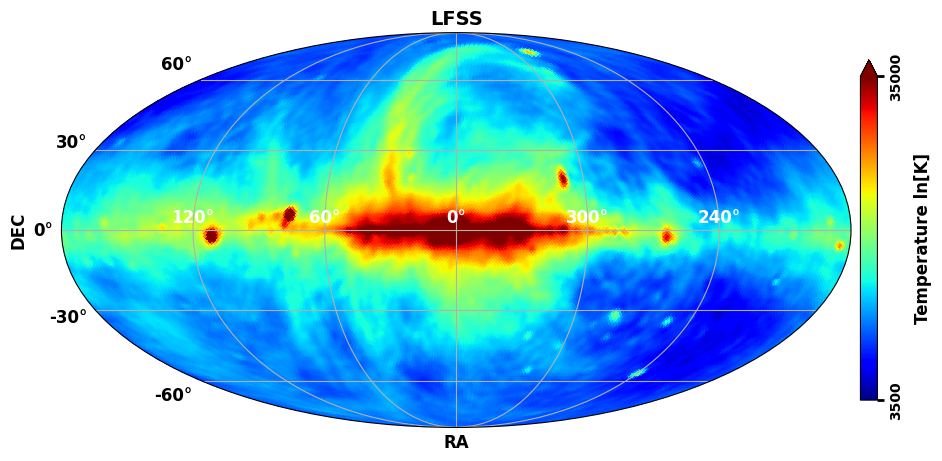

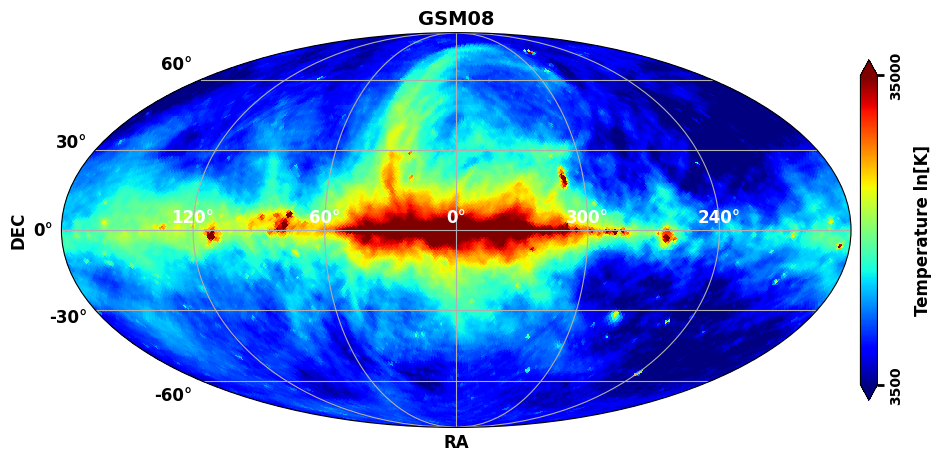

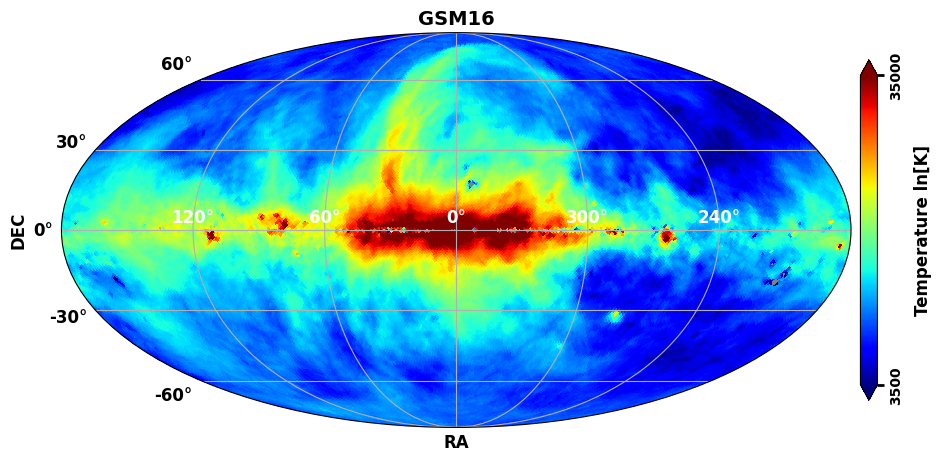

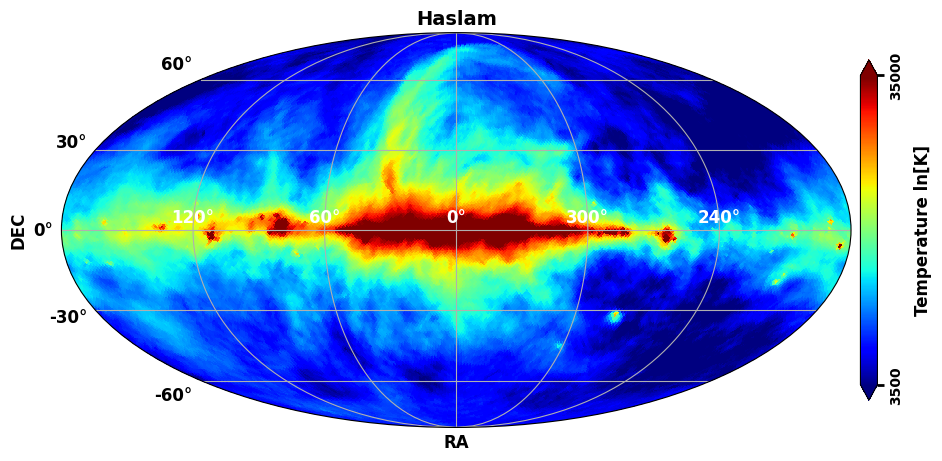

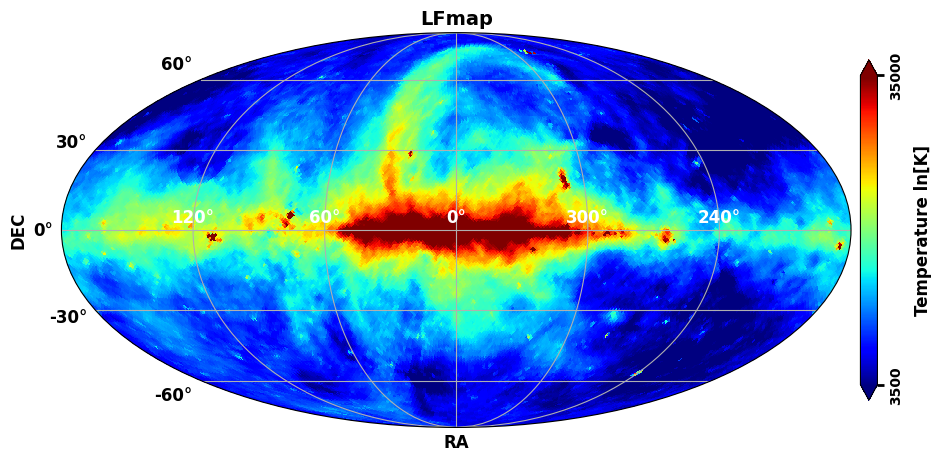

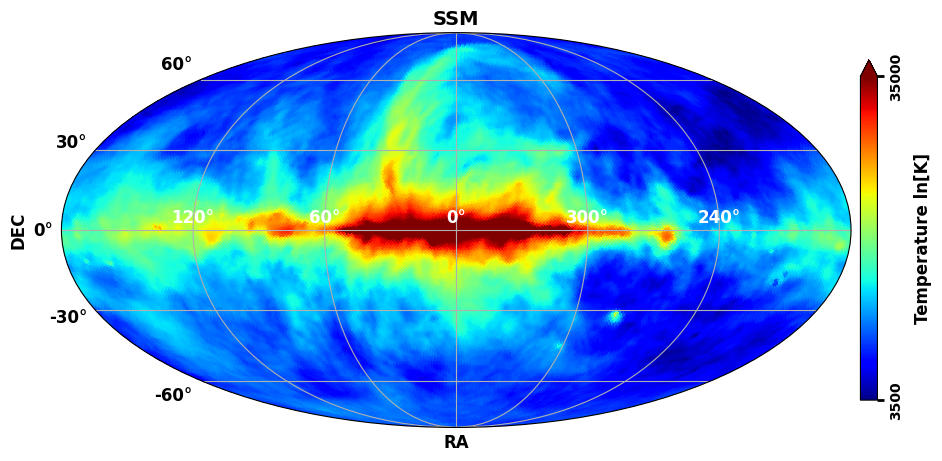

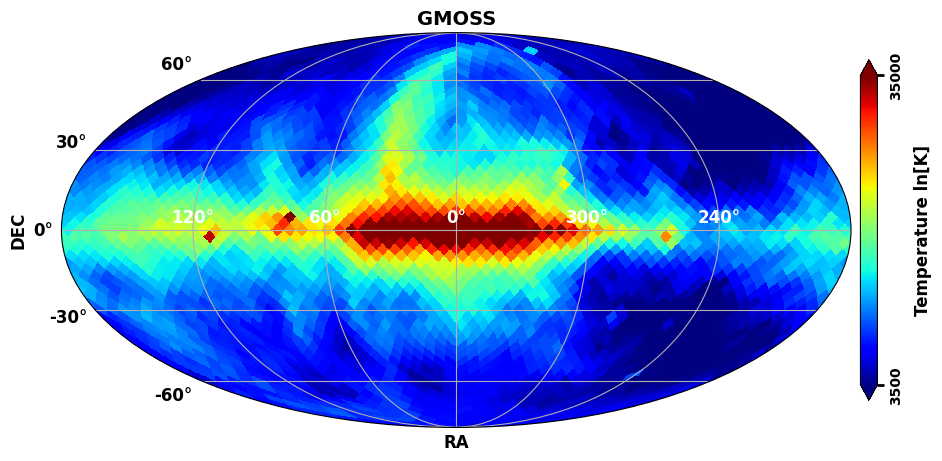

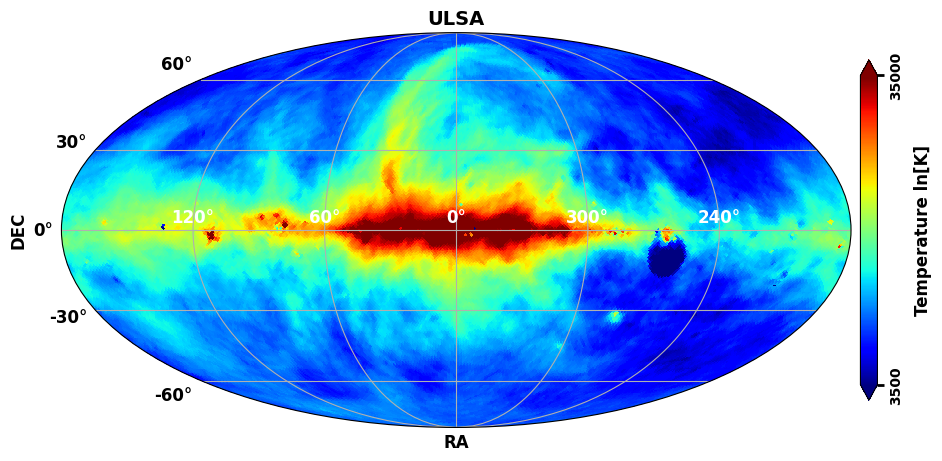

In [10]:
# Prints all maps
cmap = "jet"
projection_type = "mollweide"

for key in map_dict:

    projview(
        map_dict[key],
        norm="log",
        coord=["G"],
        graticule=True,
        graticule_labels=True,
        unit="Temperature ln[K]",
        xlabel="RA",
        ylabel="DEC",
        cb_orientation="vertical",
        min=3500,
        max=35000,
        latitude_grid_spacing=30,
        projection_type=projection_type,
        title=key,
        xtick_label_color="white",
        cmap=cmap,
    )

{'LFSS/GSM08': [0.11039941376682116],
 'LFSS/GSM16': [0.022262053826482164],
 'LFSS/Haslam': [0.05341591508303489],
 'LFSS/LFmap': [0.04890712148530718],
 'LFSS/SSM': [0.0426396115267742],
 'LFSS/GMOSS': [0.14325168305853953],
 'LFSS/ULSA': [0.01678984313885956],
 'GSM08/GSM16': [-0.07937446548296478],
 'GSM08/Haslam': [-0.05131801942373193],
 'GSM08/LFmap': [-0.0553785345337251],
 'GSM08/SSM': [-0.06102290887401007],
 'GSM08/GMOSS': [0.029585993007933187],
 'GSM08/ULSA': [-0.08430261171555276],
 'GSM16/Haslam': [0.030475415907241343],
 'GSM16/LFmap': [0.026064811423928358],
 'GSM16/SSM': [0.019933790581402988],
 'GSM16/GMOSS': [0.11835480812300014],
 'GSM16/ULSA': [-0.005353041000729197],
 'Haslam/LFmap': [-0.004280164684404286],
 'Haslam/SSM': [-0.010229865907628088],
 'Haslam/GMOSS': [0.08528043547588071],
 'Haslam/ULSA': [-0.03476886139629709],
 'LFmap/SSM': [-0.0059752763902086725],
 'LFmap/GMOSS': [0.08994558206415415],
 'LFmap/ULSA': [-0.0306197543029052],
 'SSM/GMOSS': [0.09649

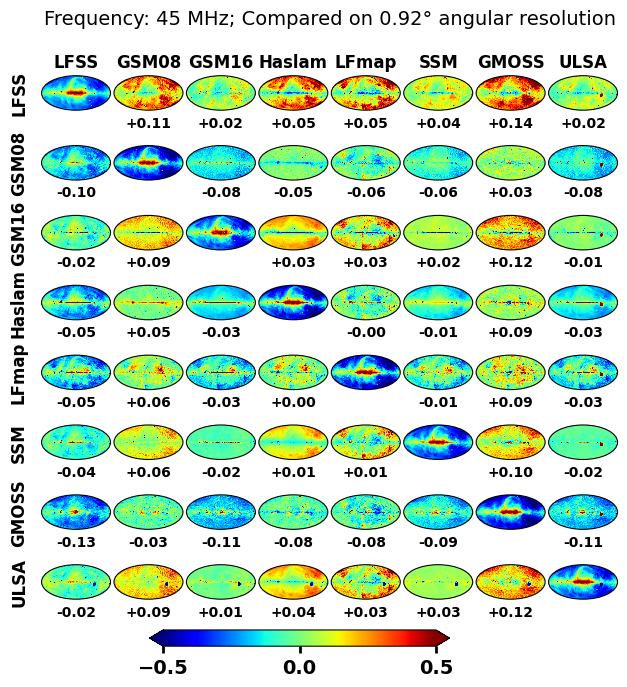

In [11]:
compare_maps(
    map_dict,
    main_title="Frequency: {} MHz; Compared on {:.2f}{} angular resolution".format(
        frequency_MHz, np.rad2deg(hp.pixelfunc.nside2resol(new_nside)), chr(176)
    ),
)

{'ULSA FDI/ULSA CI': [0.00016637697495314185],
 'ULSA FDI/ULSA DPI': [-0.01154210020249169],
 'ULSA CI/ULSA DPI': [-0.011706529480482675]}

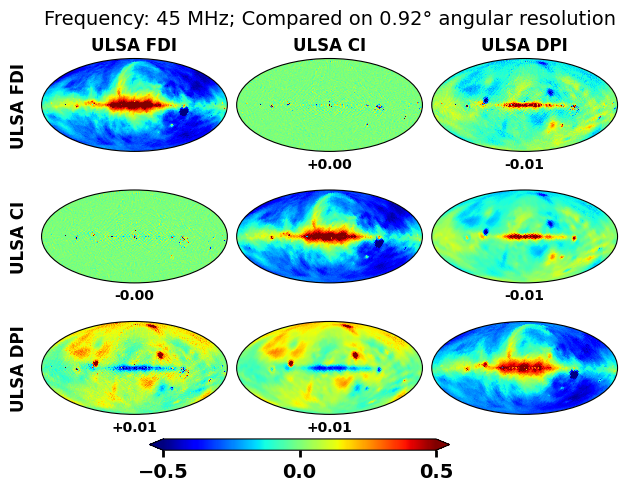

In [12]:
compare_maps(
    ulsa_map_dict,
    main_title="Frequency: {} MHz; Compared on {:.2f}{} angular resolution".format(
        frequency_MHz, np.rad2deg(hp.pixelfunc.nside2resol(new_nside)), chr(176)
    ),
    figsize=(6, 4.5)
)

### Compare at all frequencies

In [13]:
f_range = range(30, 85, 5)
for frequency_MHz in f_range:
    # LFmap is by default in Celestial coordinates, to make things simpler, we rotate it to Galactic coordinates at the creation stage.
    lfmap_map = hp.rotator.Rotator.rotate_map_pixel(
        Rotator(coord=["C", "G"]), lfmap.generate(frequency_MHz)
    )
    lfmap_map = lfmap.generate(frequency_MHz)
    lfss_map = lfss.generate(frequency_MHz)
    gsm2008_map = gsm2008.generate(frequency_MHz)
    gsm2016_map = gsm2016.generate(frequency_MHz)
    haslam_map = haslam.generate(frequency_MHz)
    ssm_map = ssm.generate(frequency_MHz)
    gmoss_map = gmoss.generate(frequency_MHz)
    ulsa_fdi_map = ulsa_fdi.generate(frequency_MHz)
    ulsa_ci_map = ulsa_ci.generate(frequency_MHz)
    ulsa_dpi_map = ulsa_dpi.generate(frequency_MHz)

    # convert to same NSIDE
    new_nside = 64
    lfmap_map_N = hp.ma(hp.pixelfunc.ud_grade(lfmap_map, new_nside))
    lfss_map_N = hp.ma(hp.pixelfunc.ud_grade(lfss_map, new_nside))
    gsm2008_map_N = hp.ma(hp.pixelfunc.ud_grade(gsm2008_map, new_nside))
    gsm2016_map_N = hp.ma(hp.pixelfunc.ud_grade(gsm2016_map, new_nside))
    ssm_map_N = hp.ma(hp.pixelfunc.ud_grade(ssm_map, new_nside))
    haslam_map_N = hp.ma(hp.pixelfunc.ud_grade(haslam_map, new_nside))
    gmoss_map_N = hp.ma(hp.pixelfunc.ud_grade(gmoss_map, new_nside))
    ulsa_fdi_map_N = hp.ma(hp.pixelfunc.ud_grade(ulsa_fdi_map, new_nside))
    ulsa_ci_map_N = hp.ma(hp.pixelfunc.ud_grade(ulsa_ci_map, new_nside))
    ulsa_dpi_map_N = hp.ma(hp.pixelfunc.ud_grade(ulsa_dpi_map, new_nside))

    map_temp_dict = {
        "LFSS": lfss_map_N,
        "GSM08": gsm2008_map_N,
        "GSM16": gsm2016_map_N,
        "Haslam": haslam_map_N,
        "LFmap": lfmap_map_N,
        "SSM": ssm_map_N,
        "GMOSS": gmoss_map_N,
        "ULSA": ulsa_fdi_map_N,
        # "ULSA2": ulsa_ci_map_N,
        # "ULSA3": ulsa_dpi_map_N,
    }


    compare_dict = compare_maps(
        map_temp_dict,
        show_plot_comparison=False,
        verbose=False
    )

    if frequency_MHz == list(f_range)[0]:
        compare_DF = pd.DataFrame(compare_dict).T
        compare_DF.columns = [list(f_range)[0]]
    else:
        compare_DF[frequency_MHz] = pd.DataFrame(compare_dict).T.values

[INFO] Outputing map at 30.0 MHz
[INFO] Outputing map at 30.0 MHz


[INFO] Outputing map at 35.0 MHz
[INFO] Outputing map at 35.0 MHz


[INFO] Outputing map at 40.0 MHz
[INFO] Outputing map at 40.0 MHz


[INFO] Outputing map at 45.0 MHz
[INFO] Outputing map at 45.0 MHz


[INFO] Outputing map at 50.0 MHz


[INFO] Outputing map at 50.0 MHz


[INFO] Outputing map at 55.0 MHz
[INFO] Outputing map at 55.0 MHz


[INFO] Outputing map at 60.0 MHz
[INFO] Outputing map at 60.0 MHz


[INFO] Outputing map at 65.0 MHz
[INFO] Outputing map at 65.0 MHz


[INFO] Outputing map at 70.0 MHz
[INFO] Outputing map at 70.0 MHz


[INFO] Outputing map at 75.0 MHz
[INFO] Outputing map at 75.0 MHz


[INFO] Outputing map at 80.0 MHz
[INFO] Outputing map at 80.0 MHz


In [14]:
fig = px.imshow(
    compare_DF,
    width=500,
    height=600,
    color_continuous_scale="jet",
    zmin=-0.3,
    zmax=0.3,
    labels={"x": "<b>frequency [MHz]</b>"},
)
fig.update_layout(
    margin=dict(l=20, r=120, t=20, b=20),
    xaxis={"nticks": 5},
    font=dict(family="Arial Black", size=15, color="black"),
)
fig.update_yaxes(tickprefix="<b>", ticksuffix="</b>")
fig.update_xaxes(
    tickprefix="<b>", ticksuffix="</b>", tick0=30, dtick=10, tickfont=dict(size=18)
)

fig.update_coloraxes(
    colorbar=dict(
        tickprefix="<b>",
        ticksuffix="</b>",
        tickfont=dict(size=18),
    )
)

fig.add_annotation(
    go.layout.Annotation(
        text='<b>RDIS</b>',
        x=1.4,
        y=0.5,
        xref='paper',
        yref='paper',
        showarrow=False,
        font=dict(size=18),
        textangle=-90,
        align='center',
        valign='middle',
    )
)

fig.show()

(-0.15, 0.15)

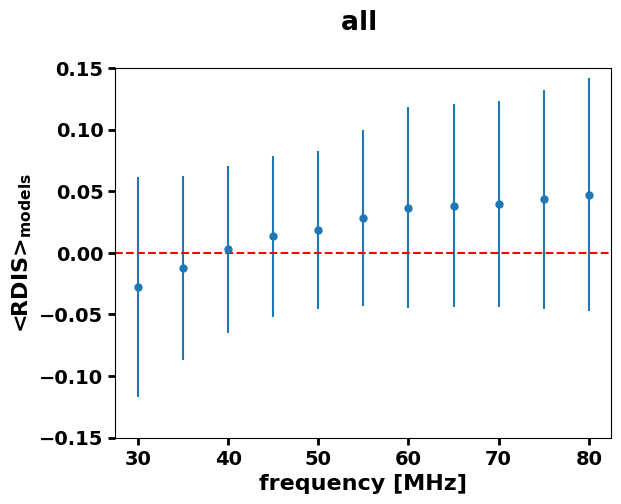

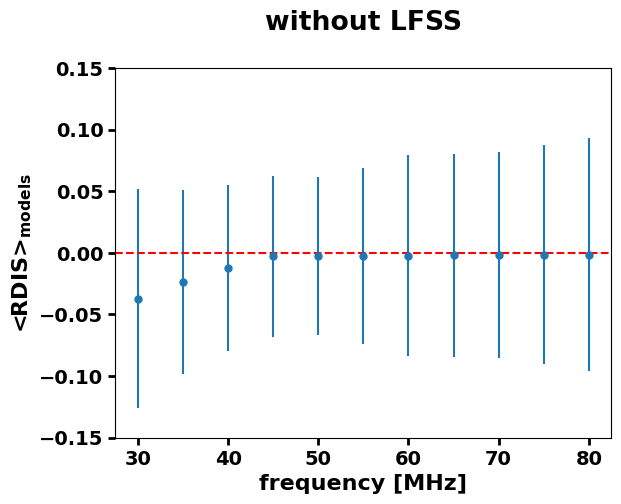

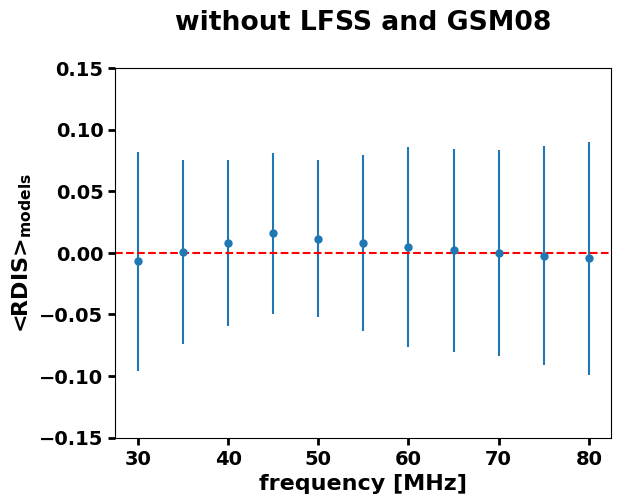

In [15]:
fig, ax = plt.subplots()
ax.set_title('all \n')

# temp = compare_DF.std(axis=0)
labels = compare_DF.columns.astype(float)
ax.errorbar(
    labels,
    compare_DF.mean(axis=0).values,
    yerr=compare_DF.std(axis=0),
    marker=".",
    linestyle="",
    markersize=10,
)

ax.axes.axhline(0, ls="--", c="r")
ax.set_xlabel("frequency [MHz]")
ax.set_ylabel("<RDIS>$_{\mathrm{models}}$")
ax.set_ylim(-0.15, 0.15)

fig, ax = plt.subplots()
ax.set_title('without LFSS\n')

ax.errorbar(
    labels,
    compare_DF.iloc[7:,:].mean(axis=0).values,
    yerr=compare_DF.std(axis=0),
    marker=".",
    linestyle="",
    markersize=10,
)

ax.axes.axhline(0, ls="--", c="r")
ax.set_xlabel("frequency [MHz]")
ax.set_ylabel("<RDIS>$_{\mathrm{models}}$")
ax.set_ylim(-0.15, 0.15)


fig, ax = plt.subplots()
ax.set_title('without LFSS and GSM08\n')

ax.errorbar(
    labels,
    compare_DF.iloc[13:,:].mean(axis=0).values,
    yerr=compare_DF.std(axis=0),
    marker=".",
    linestyle="",
    markersize=10,
)

ax.axes.axhline(0, ls="--", c="r")
ax.set_xlabel("frequency [MHz]")
ax.set_ylabel("<RDIS>$_{\mathrm{models}}$")
ax.set_ylim(-0.15, 0.15)

In [16]:
compare_DF.iloc[12:,:]

,30,35,40,45,50,55,60,65,70,75,80
GSM08/ULSA,-0.171779,-0.134535,-0.104247,-0.084303,-0.071164,-0.059974,-0.050348,-0.042000,-0.034717,-0.028329,-0.022703
GSM16/Haslam,-0.077676,-0.037941,-0.002162,0.030475,0.024773,0.019603,0.014868,0.010493,0.006421,0.002608,-0.000985
GSM16/LFmap,-0.030258,-0.010814,0.007876,0.026065,0.008672,-0.005753,-0.017827,-0.028012,-0.036658,-0.044036,-0.050360
GSM16/SSM,-0.072859,-0.040363,-0.009378,0.019934,0.011133,0.003672,-0.002850,-0.008690,-0.014021,-0.018959,-0.023586
GSM16/GMOSS,0.060546,0.078556,0.098248,0.118355,0.099903,0.084559,0.071519,0.060248,0.050368,0.041610,0.033771
GSM16/ULSA,-0.101470,-0.066393,-0.034611,-0.005353,-0.012589,-0.018845,-0.024322,-0.029172,-0.033512,-0.037433,-0.041004
Haslam/LFmap,0.051411,0.028197,0.010061,-0.004280,-0.015712,-0.024868,-0.032216,-0.038105,-0.042804,-0.046522,-0.049424
Haslam/SSM,0.005223,-0.002517,-0.007231,-0.010230,-0.013310,-0.015625,-0.017458,-0.018984,-0.020312,-0.021511,-0.022624
Haslam/GMOSS,0.149863,0.121092,0.100628,0.085280,0.073313,0.063707,0.055822,0.049238,0.043666,0.038901,0.034790
Haslam/ULSA,-0.025797,-0.029574,-0.032519,-0.034769,-0.036459,-0.037709,-0.038616,-0.039253,-0.039679,-0.039936,-0.040058


Text(0.5, 0, '<RDIS>$_{\\nu}$')

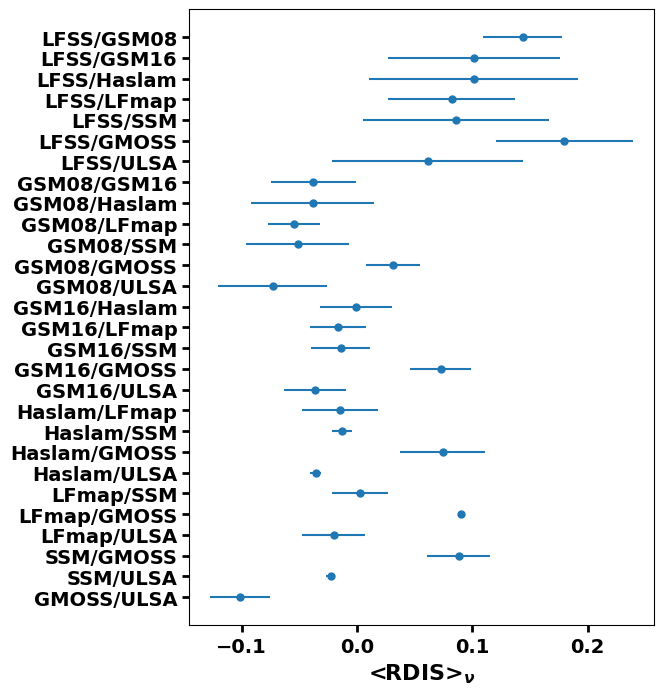

In [17]:
df = compare_DF.copy(deep=True)
df = compare_DF.iloc[::-1,:]
fig, ax = plt.subplots(figsize=(6, 8))
labels = df.index.values
err = df.std(axis=1)

pos = range(labels.size)
ax.errorbar(
    df.mean(axis=1), pos, xerr=err, marker=".", linestyle="", markersize=10
)
ax.set_yticks(pos, labels=labels)
ax.set_xlabel("<RDIS>$_{\\nu}$")

Test1: p0.5=0.00028759959500579413
Test2: p0.5=-0.00028760123860066544
Test3: p0.5+/-0.341=0.00046706742461266604
0.011255627813906877 -0.07128564282141076 0.12031015507753873
Normalization test:  (1.0000000656061603, 1.7338160109946747e-07)
Test1: p0.5=-0.0004944879269374591
Test2: p0.5=0.0004944879268438118
Test3: p0.5+/-0.341=0.0006370680887921587
-0.010755377688844436 -0.08329164582291149 0.068784392196098
Normalization test:  (0.9999997813929308, 9.503192454282732e-06)


(array([-0.5       , -0.49949975, -0.4989995 , ...,  0.4989995 ,
         0.49949975,  0.5       ]),
 array([-24.75638554, -24.69010646, -24.62392474, ..., -27.34904866,
        -27.41952959, -27.4901091 ]),
 (-0.08329164582291149, 0.0692846423211605, -0.010755377688844436))

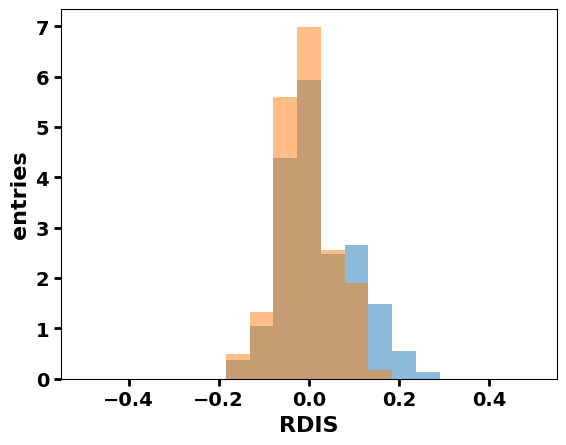

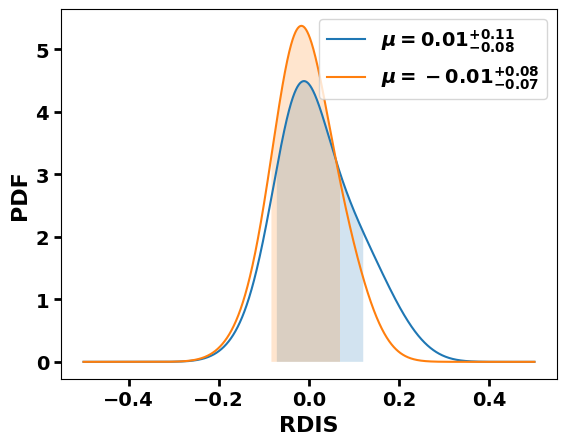

In [18]:
input_data1 = compare_DF.values.flatten()
input_data2 = compare_DF.iloc[7:, :].values.flatten()

bins = np.linspace(-0.5, 0.5, 20)
fig, ax = plt.subplots()
fig.suptitle('')
ax.hist(input_data1, bins=bins, density=True, alpha=0.5)
ax.hist(input_data2, bins=bins, density=True, alpha=0.5)

ax.set_xlabel("RDIS")
ax.set_ylabel("entries")

fig, ax = plt.subplots()
# fig.suptitle('Blue: all models, Red: without LFSS')
ax.set_xlabel("RDIS")
apply_KDE(input_data1, bounds=[bins[0], bins[-1]], data_in_relative_values=True)
apply_KDE(input_data2, bounds=[bins[0], bins[-1]], data_in_relative_values=True)

In [19]:
display(input_data1.size)
display(input_data2.size)

308

231

## Local obsever

In [20]:
lst = 18
latitude = -35.206667
frequency_MHz = 45
main_title = "Frequency: {} MHz; Compared on {:.2f}{} angular resolution; LST:{}; Latitude:{:.2f}".format(
    frequency_MHz, np.rad2deg(hp.pixelfunc.nside2resol(new_nside)), chr(176), lst, latitude
)

# Local coordinates at LST time "LSTtime" at latitude "latitude"
rotation_parameters = [(180 + (lst * 15)) % 360, -(latitude - 90)]

In [21]:
# some plot settings
cmap = "jet"
projection_type = "mollweide"

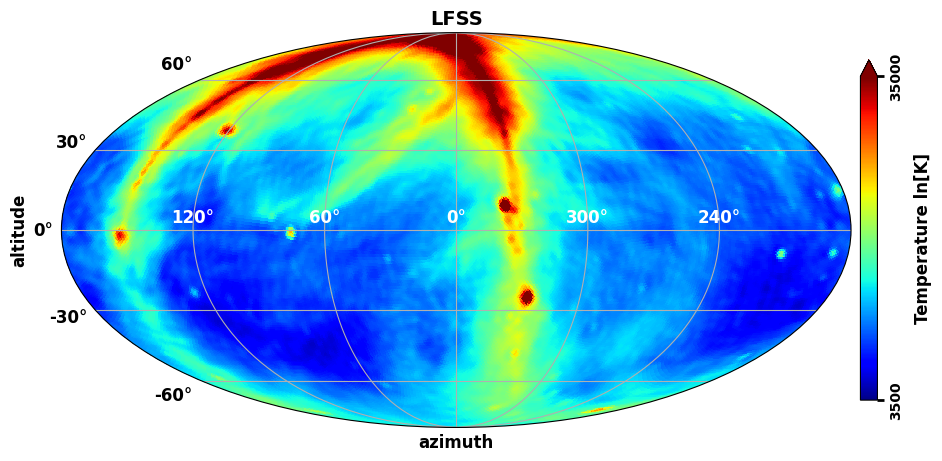

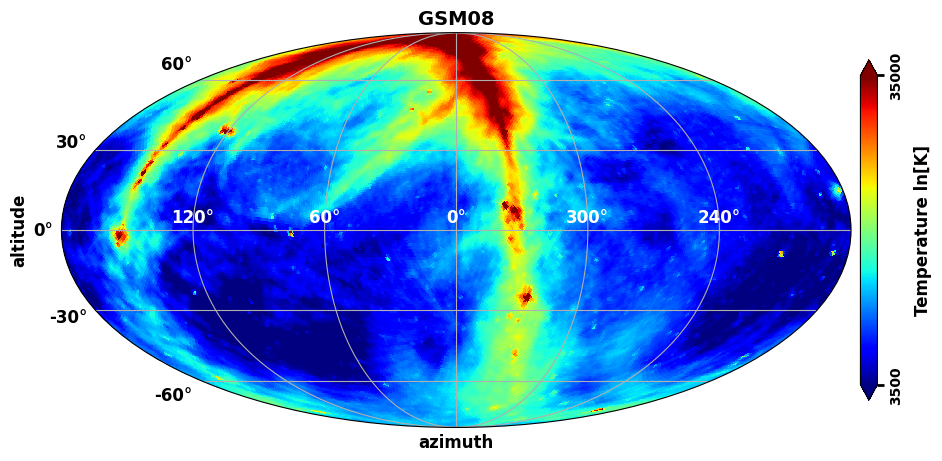

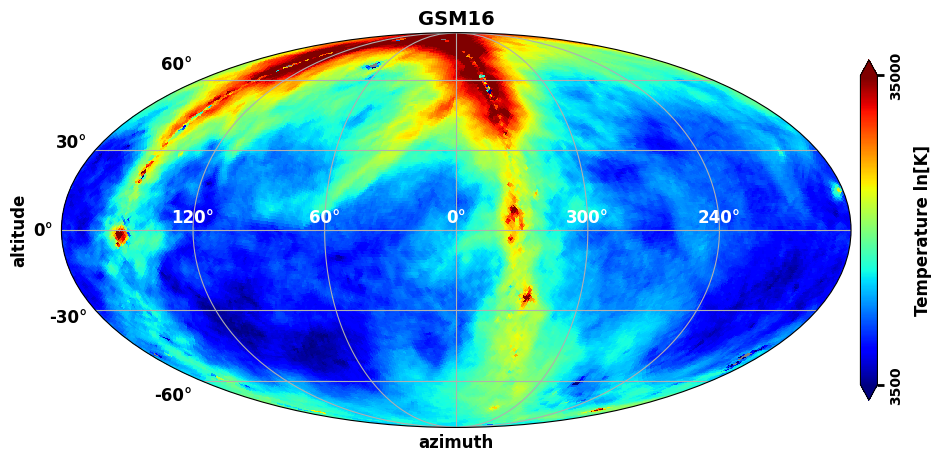

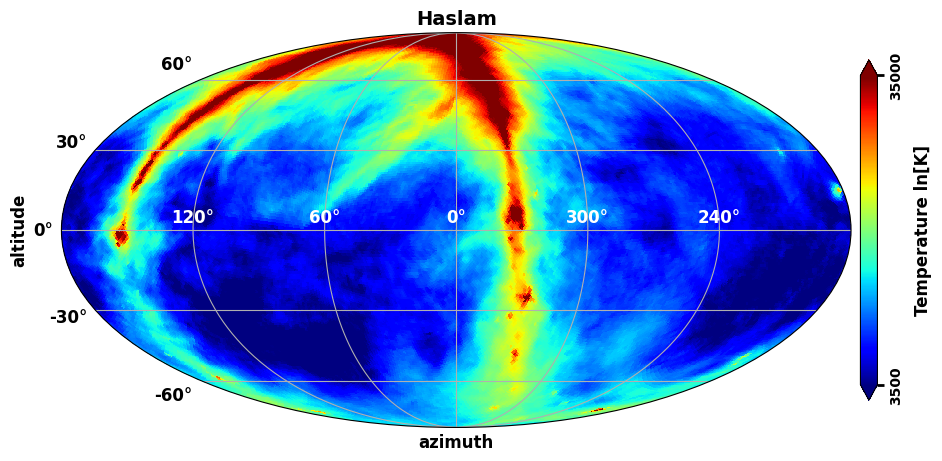

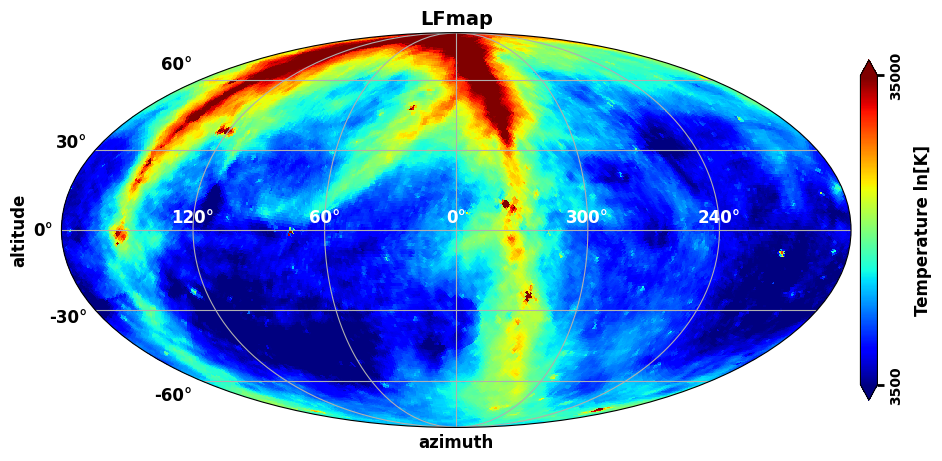

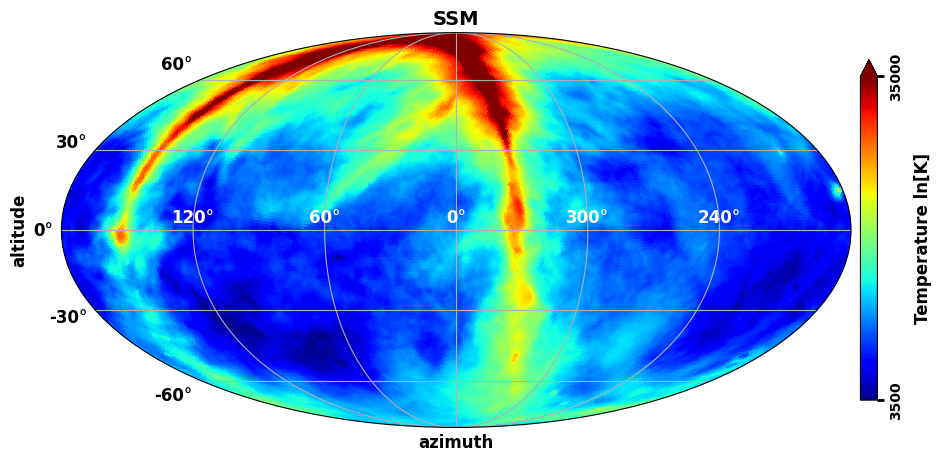

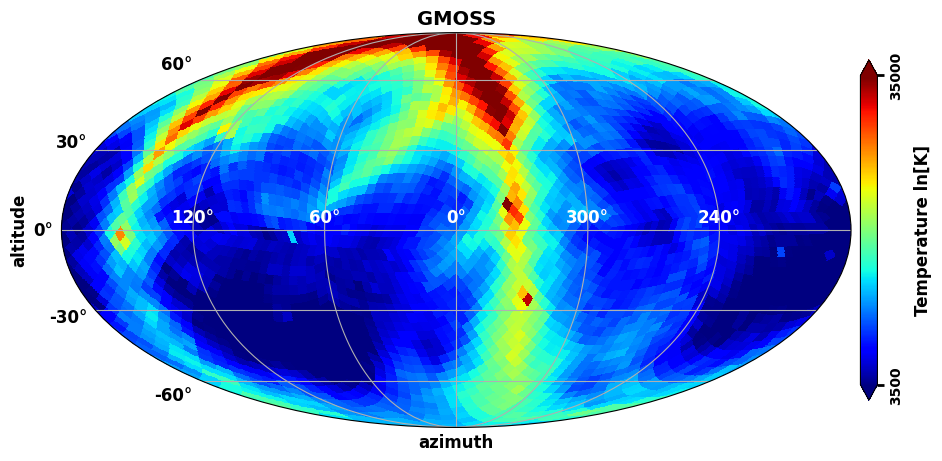

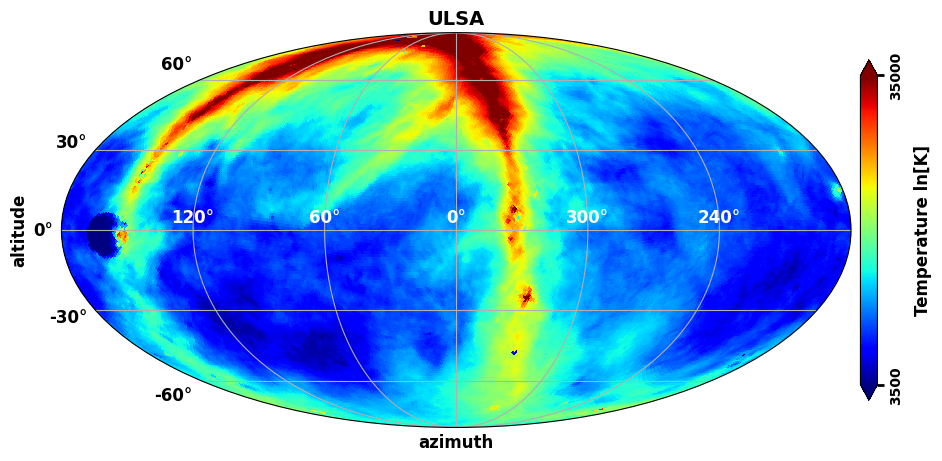

In [22]:
# Prints all maps
for key in map_dict:

    projview(
        map_dict[key],
        norm="log",
        coord=['G','C'],
        rot=rotation_parameters,
        graticule=True,
        graticule_labels=True,
        unit="Temperature ln[K]",
        xlabel="azimuth",
        ylabel="altitude",
        cb_orientation="vertical",
        min=3500,
        max=35000,
        latitude_grid_spacing=30,
        projection_type=projection_type,
        title=key,
        xtick_label_color="white",
        cmap=cmap,
    )

In [23]:
# Create mask, at local coordinates we see only a hemisphere
mask = create_local_mask(new_nside, rotation_parameters)

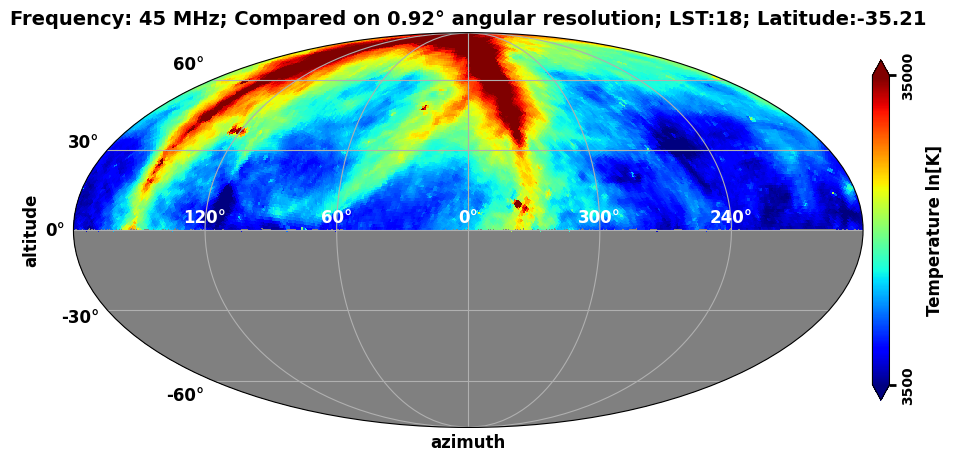

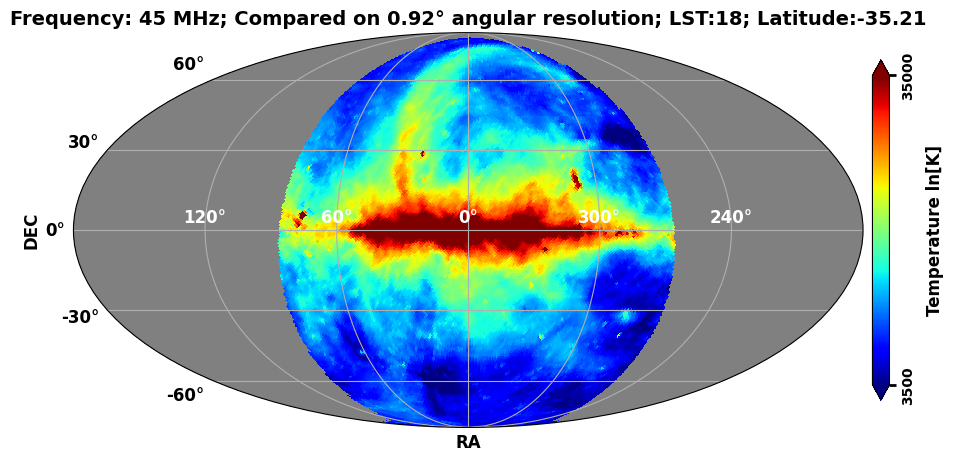

In [24]:
# Test
m = map_dict['LFmap'].copy()
m.mask = mask

projview(
    m,
    norm="log",
    coord=["G", 'C'],
    rot=rotation_parameters,
    graticule=True,
    graticule_labels=True,
    unit="Temperature ln[K]",
    xlabel="azimuth",
    ylabel="altitude",
    cb_orientation="vertical",
    min=3500,
    max=35000,
    latitude_grid_spacing=30,
    xtick_label_color="white",
    title=main_title,
    cmap=cmap,
)

projview(
    m,
    norm="log",
    # coord=["G"],
    # rot=False,
    graticule=True,
    graticule_labels=True,
    unit="Temperature ln[K]",
    xlabel="RA",
    ylabel="DEC",
    cb_orientation="vertical",
    min=3500,
    max=35000,
    latitude_grid_spacing=30,
    xtick_label_color="white",
    title=main_title,
    cmap=cmap,
)

### In local coordinates

{'LFSS/GSM08': [0.0697014364597286],
 'LFSS/GSM16': [0.020495520208995366],
 'LFSS/Haslam': [0.004455862956272538],
 'LFSS/LFmap': [-0.008330799565943736],
 'LFSS/SSM': [0.020960864878340812],
 'LFSS/GMOSS': [0.09465288148876283],
 'LFSS/ULSA': [0.01628783362788977],
 'GSM08/GSM16': [-0.045999672968173644],
 'GSM08/Haslam': [-0.06099419078971413],
 'GSM08/LFmap': [-0.07294767807728375],
 'GSM08/SSM': [-0.04556465002299992],
 'GSM08/GMOSS': [0.023325616081823153],
 'GSM08/ULSA': [-0.049933187907661325],
 'GSM16/Haslam': [-0.015717518533974517],
 'GSM16/LFmap': [-0.028247375127169128],
 'GSM16/SSM': [0.00045599873799551105],
 'GSM16/GMOSS': [0.07266799296147819],
 'GSM16/ULSA': [-0.004123179864860105],
 'Haslam/LFmap': [-0.012729939655669043],
 'Haslam/SSM': [0.016431784143796424],
 'Haslam/GMOSS': [0.08979689587059214],
 'Haslam/ULSA': [0.011779482910074135],
 'LFmap/SSM': [0.029537737414314647],
 'LFmap/GMOSS': [0.10384882479926794],
 'LFmap/ULSA': [0.024825449033869074],
 'SSM/GMOSS':

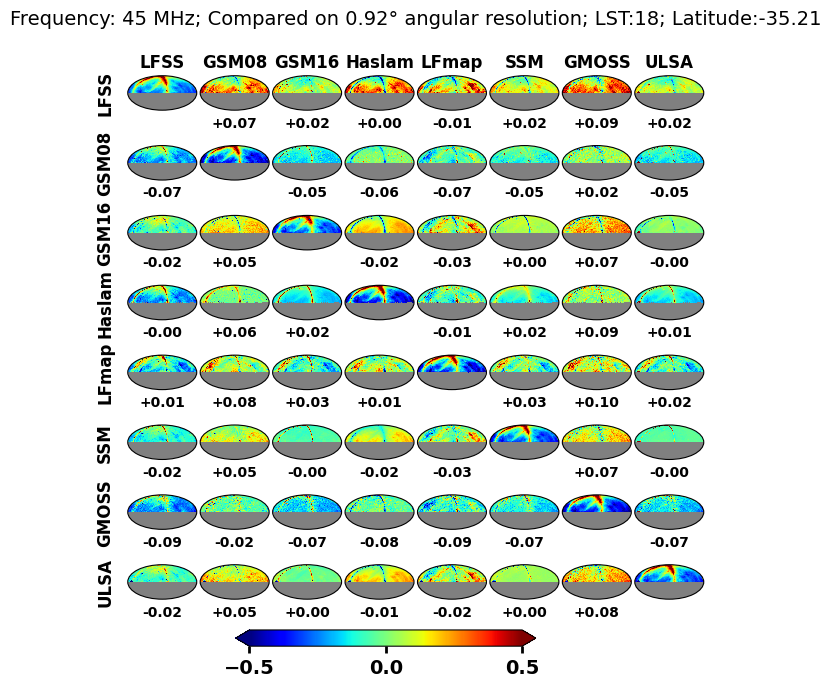

In [25]:
compare_maps(
    map_dict, rotation_parameters=rotation_parameters, coord=['G','C'], main_title=main_title, mask=mask
)

### In galactic coordinates (masked)

{'LFSS/GSM08': [0.0697014364597286],
 'LFSS/GSM16': [0.020495520208995366],
 'LFSS/Haslam': [0.004455862956272538],
 'LFSS/LFmap': [-0.008330799565943736],
 'LFSS/SSM': [0.020960864878340812],
 'LFSS/GMOSS': [0.09465288148876283],
 'LFSS/ULSA': [0.01628783362788977],
 'GSM08/GSM16': [-0.045999672968173644],
 'GSM08/Haslam': [-0.06099419078971413],
 'GSM08/LFmap': [-0.07294767807728375],
 'GSM08/SSM': [-0.04556465002299992],
 'GSM08/GMOSS': [0.023325616081823153],
 'GSM08/ULSA': [-0.049933187907661325],
 'GSM16/Haslam': [-0.015717518533974517],
 'GSM16/LFmap': [-0.028247375127169128],
 'GSM16/SSM': [0.00045599873799551105],
 'GSM16/GMOSS': [0.07266799296147819],
 'GSM16/ULSA': [-0.004123179864860105],
 'Haslam/LFmap': [-0.012729939655669043],
 'Haslam/SSM': [0.016431784143796424],
 'Haslam/GMOSS': [0.08979689587059214],
 'Haslam/ULSA': [0.011779482910074135],
 'LFmap/SSM': [0.029537737414314647],
 'LFmap/GMOSS': [0.10384882479926794],
 'LFmap/ULSA': [0.024825449033869074],
 'SSM/GMOSS':

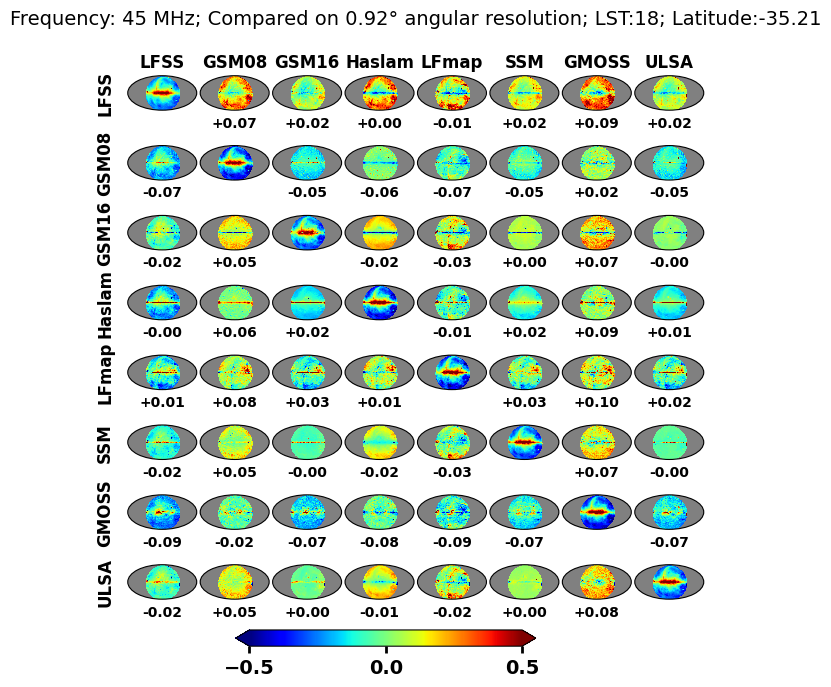

In [26]:
compare_maps(map_dict, rotation_parameters=False, main_title=main_title, mask=mask)

### Complex comparison

In [27]:
f_range = range(30, 85, 5)
lst_range = range(0, 24, 2)
# f_range = range(30, 45, 5)
# lst_range = range(0, 6, 2)
compare_DF = pd.DataFrame(columns=['label', 'frequency [MHz]', 'LST', 'ratio'])

for frequency_MHz in f_range:
    lfmap_map = hp.rotator.Rotator.rotate_map_pixel(
        Rotator(coord=["C", "G"]), lfmap.generate(frequency_MHz)
    )
    lfmap_map = lfmap.generate(frequency_MHz)
    lfss_map = lfss.generate(frequency_MHz)
    gsm2008_map = gsm2008.generate(frequency_MHz)
    gsm2016_map = gsm2016.generate(frequency_MHz)
    haslam_map = haslam.generate(frequency_MHz)
    ssm_map = ssm.generate(frequency_MHz)
    gmoss_map = gmoss.generate(frequency_MHz)
    ulsa_fdi_map = ulsa_fdi.generate(frequency_MHz)
    ulsa_ci_map = ulsa_ci.generate(frequency_MHz)
    ulsa_dpi_map = ulsa_dpi.generate(frequency_MHz)

    # convert to same NSIDE
    new_nside = 64
    lfmap_map_N = hp.ma(hp.pixelfunc.ud_grade(lfmap_map, new_nside))
    lfss_map_N = hp.ma(hp.pixelfunc.ud_grade(lfss_map, new_nside))
    gsm2008_map_N = hp.ma(hp.pixelfunc.ud_grade(gsm2008_map, new_nside))
    gsm2016_map_N = hp.ma(hp.pixelfunc.ud_grade(gsm2016_map, new_nside))
    ssm_map_N = hp.ma(hp.pixelfunc.ud_grade(ssm_map, new_nside))
    haslam_map_N = hp.ma(hp.pixelfunc.ud_grade(haslam_map, new_nside))
    gmoss_map_N = hp.ma(hp.pixelfunc.ud_grade(gmoss_map, new_nside))
    ulsa_fdi_map_N = hp.ma(hp.pixelfunc.ud_grade(ulsa_fdi_map, new_nside))
    ulsa_ci_map_N = hp.ma(hp.pixelfunc.ud_grade(ulsa_ci_map, new_nside))
    ulsa_dpi_map_N = hp.ma(hp.pixelfunc.ud_grade(ulsa_dpi_map, new_nside))

    map_temp_dict = {
        "LFSS": lfss_map_N,
        "GSM08": gsm2008_map_N,
        "GSM16": gsm2016_map_N,
        "Haslam": haslam_map_N,
        "LFmap": lfmap_map_N,
        "SSM": ssm_map_N,
        "GMOSS": gmoss_map_N,
        "ULSA": ulsa_fdi_map_N,
        # "ULSA2": ulsa_ci_map_N,
        # "ULSA3": ulsa_dpi_map_N,
    }
    
    for lst in lst_range:
        rotation_parameters = [(180 + (lst * 15)) % 360, -(latitude - 90)]
        mask = create_local_mask(new_nside, rotation_parameters)

        compare_dict = compare_maps(
            map_temp_dict,
            rotation_parameters=False,
            mask=mask,
            show_plot_comparison=False,
            verbose=False
        )

        for key in compare_dict:
            compare_DF.loc[compare_DF.index.size] = [key, frequency_MHz, lst, compare_dict[key][0]]



[INFO] Outputing map at 30.0 MHz
[INFO] Outputing map at 30.0 MHz


[INFO] Outputing map at 35.0 MHz
[INFO] Outputing map at 35.0 MHz


[INFO] Outputing map at 40.0 MHz
[INFO] Outputing map at 40.0 MHz


[INFO] Outputing map at 45.0 MHz
[INFO] Outputing map at 45.0 MHz


[INFO] Outputing map at 50.0 MHz
[INFO] Outputing map at 50.0 MHz


[INFO] Outputing map at 55.0 MHz
[INFO] Outputing map at 55.0 MHz


[INFO] Outputing map at 60.0 MHz
[INFO] Outputing map at 60.0 MHz


[INFO] Outputing map at 65.0 MHz
[INFO] Outputing map at 65.0 MHz


[INFO] Outputing map at 70.0 MHz
[INFO] Outputing map at 70.0 MHz


[INFO] Outputing map at 75.0 MHz
[INFO] Outputing map at 75.0 MHz


[INFO] Outputing map at 80.0 MHz
[INFO] Outputing map at 80.0 MHz


In [28]:
compare_DF
df = compare_DF.sort_values(by=['label', 'frequency [MHz]', 'LST'])
models_ratio_list = list(dict.fromkeys(df.label.values))

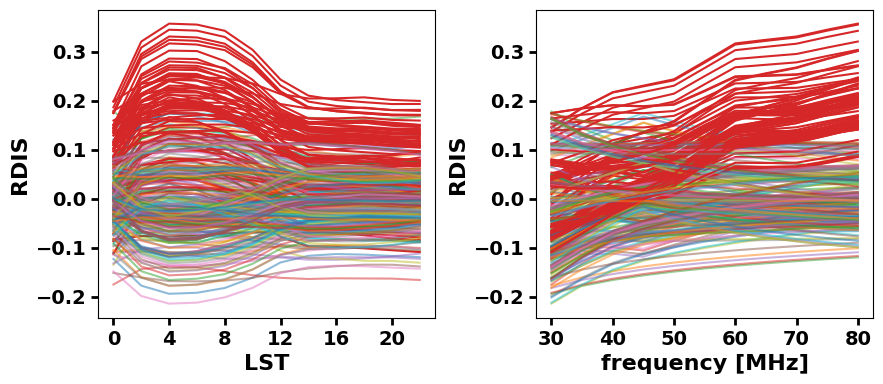

In [29]:
default_color_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']
# delete red
r = default_color_cycle[3]
del default_color_cycle[3]
b='k'
# b = default_color_cycle[0]
# del default_color_cycle[0]

fig, ax = plt.subplots(1,2, figsize=(10,4))

for i, frequency in enumerate(f_range):
    for models_ratio in models_ratio_list:
        temp = df[(df['label']==models_ratio) & (df['frequency [MHz]']==frequency)]
        if 'LFSS' in models_ratio:
            ax[0].plot(temp.LST.values, temp.ratio.values, c=r, alpha=1)#, zorder=len(f_range)+i)
        elif 'GSM08' in models_ratio:
            ax[0].plot(temp.LST.values, temp.ratio.values, alpha=0.5)#, zorder=len(f_range)+i)
        else:
            ax[0].plot(temp.LST.values, temp.ratio.values, alpha=0.5)

ax[0].set_xlabel('LST')
ax[0].set_ylabel('RDIS')

for lst in lst_range:
    for models_ratio in models_ratio_list:
        temp = df[(df['label']==models_ratio) & (df['LST']==lst)]
        if 'LFSS' in models_ratio:
           ax[1].plot(temp['frequency [MHz]'].values, temp.ratio.values, c=r, alpha=1)#, zorder=len(f_range)+i)
        elif 'GSM08' in models_ratio:
           ax[1].plot(temp['frequency [MHz]'].values, temp.ratio.values, alpha=0.5)#, zorder=len(f_range)+i)
        else:
           ax[1].plot(temp['frequency [MHz]'].values, temp.ratio.values, alpha=0.5)

ax[1].set_xlabel('frequency [MHz]')
ax[1].set_ylabel('RDIS')
fig.subplots_adjust(wspace=0.3)

ax[0].xaxis.set_major_locator(MultipleLocator(4))
ax[1].xaxis.set_major_locator(MultipleLocator(10))

# Reset to default color cycle
plt.rcParams['axes.prop_cycle'] = plt.rcParamsDefault['axes.prop_cycle']

In [30]:
center_DF = pd.DataFrame()
center_DF.index = lst_range
left_DF = center_DF.copy(deep=True)
right_DF = center_DF.copy(deep=True)

bins=np.linspace(-0.5, 0.5, 20)

for frequency in f_range:
    center = []
    left = []
    right = []
    for lst in lst_range:
        data = df[(df['frequency [MHz]'] == frequency) & (df['LST'] == lst)]['ratio'].values

        xax_kde = np.linspace(bins[0], bins[-1], 2000)[:, np.newaxis]
        kde = KernelDensity(kernel="gaussian", bandwidth=0.05).fit(data[:, np.newaxis])
        log_dens = kde.score_samples(xax_kde)

        xax_ = xax_kde.flatten()

        center_i = find_index_on_CDF(log_dens, xax_kde, 0.5)
        left_i = find_index_on_CDF(log_dens, xax_kde, 0.5-0.341)
        right_i = find_index_on_CDF(log_dens, xax_kde, 0.5+0.341)

        center.append(xax_[center_i])
        left.append(xax_[left_i+1])
        right.append(xax_[right_i])
    center_DF[frequency] = center
    left_DF[frequency] = left
    right_DF[frequency] = right


In [31]:
font = "Arial Black"

scene = dict(
    xaxis=dict(
        title="<b>frequency [MHz]</b>",
        color="black",
        tickvals=list(range(len(f_range))),
        ticktext=center_DF.columns.values,
    ),
    yaxis=dict(
        title="<b>LST [hour]</b>",
        color="black",
        tickvals=list(range(len(lst_range))),
        ticktext=center_DF.index.values.tolist(),
    ),
    zaxis=dict(title="<b><RDIS></b>", range=(-0.1, 0.05), dtick=0.05),
    aspectratio=dict(x=0.75, y=0.75, z=0.75),  # Adjust the aspect ratio as needed
    camera=dict(eye=dict(x=1.2, y=1.2, z=0.6)),  # Adjust the camera position as needed
)

# layout = go.Layout(scene=scene)

fig = go.Figure(
    data=[
        # go.Surface(z=right_DF),
        go.Surface(z=center_DF, showscale=True, opacity=0.9)
    ],
    # go.Surface(z=left_DF, showscale=False, opacity=0.9)],
)

fig.update_layout(
    scene=scene,
    margin=dict(r=50, b=10, l=10, t=10),
    height=600,
    autosize=False,
    font=dict(family=font, size=18, color="black"),
)

fig.update_traces(
    colorbar=dict(
        tickprefix="<b>",
        ticksuffix="</b>",
        title="<b><RDIS></b>",
        titleside="right",
        tickfont=dict(size=18),
        len=0.75,  # Adjust the length of the colorbar
    )
)

fig.show()
################################################################
################################################################
################################################################

fig = go.Figure(
    data=[
        go.Surface(z=(center_DF - right_DF).abs(), opacity=0.5),
        # go.Surface(z=center_DF, showscale=False, opacity=0.9)],
        go.Surface(z=(center_DF - left_DF).abs(), showscale=False, opacity=0.5),
    ],
)

scene["zaxis"] = {"title": "<b><RDIS> errors</b>", "dtick": 0.05}
fig.update_layout(
    scene=scene,
    margin=dict(r=20, b=10, l=10, t=10),
    height=600,
    autosize=False,
    font=dict(family=font, size=18, color="black"),
)

fig.update_traces(
    colorbar=dict(
        tickprefix="<b>",
        ticksuffix="</b>",
        title="<b><RDIS> errors</b>",
        titleside="right",
        tickfont=dict(size=18),
        len=0.75,  # Adjust the length of the colorbar
    )
)

fig.show()

Test1: p0.5=-0.00010159188406028141
Test2: p0.5=9.924391268167909e-05
Test3: p0.5+/-0.341=-0.0007047107930632235
0.011755877938969483 -0.0757878939469735 0.12381190595297642


Text(0, 0.5, 'CDF')

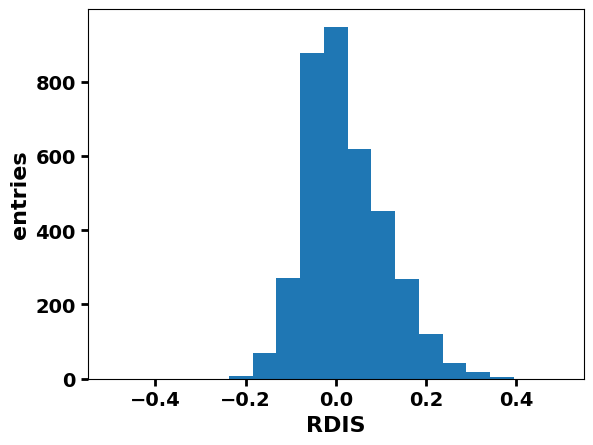

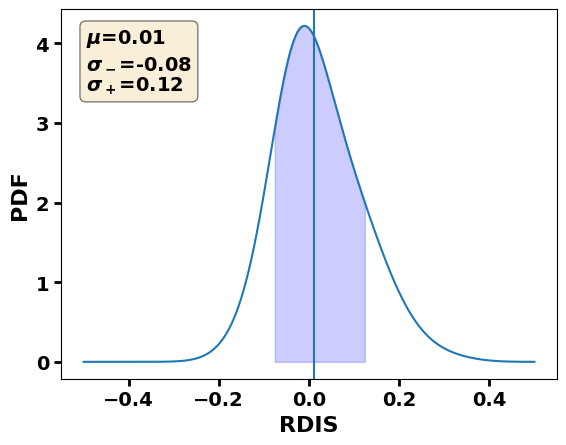

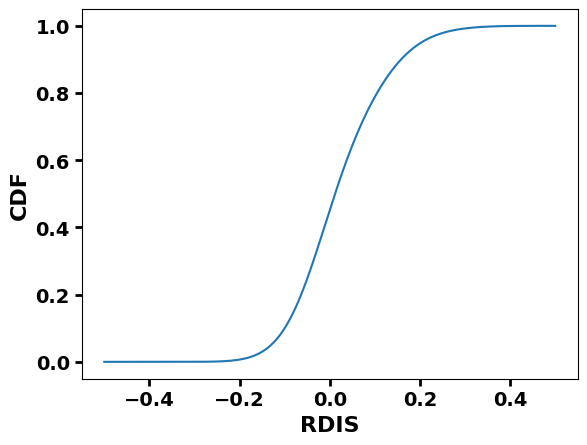

In [32]:
input_data = df.ratio.values
# input_data = df[(df['frequency [MHz]'] >45) & (df['frequency [MHz]'] <999)  & ((df['LST'] >=0) | (df['LST'] <=777))].ratio.values
input_data = df[(df['frequency [MHz]'] >0) & (df['frequency [MHz]'] <99)].ratio.values

########################################
fig, ax = plt.subplots()

bins=np.linspace(-0.5, 0.5, 20)
hist_data = ax.hist(input_data, bins=bins)

xax_kde = np.linspace(bins[0], bins[-1], 2000)[:, np.newaxis]
kde = KernelDensity(kernel="gaussian", bandwidth=0.05).fit(input_data[:, np.newaxis])
log_dens = kde.score_samples(xax_kde)

ax.set_xlabel('RDIS')
ax.set_ylabel('entries')
########################################

fig, ax = plt.subplots()

xax_ = xax_kde.flatten()
ax.plot(xax_, np.exp(log_dens))

center_i = find_index_on_CDF(log_dens, xax_kde, 0.5)
left_i = find_index_on_CDF(log_dens, xax_kde, 0.5-0.341)
right_i = find_index_on_CDF(log_dens, xax_kde, 0.5+0.341)

print('Test1: p0.5={}'.format(np.sum(np.exp(log_dens[:center_i+1])*np.diff(xax_)[0]) - 0.5))
print('Test2: p0.5={}'.format(np.sum(np.exp(log_dens[center_i+1:])*np.diff(xax_)[0]) - 0.5))
print('Test3: p0.5+/-0.341={}'.format(np.sum(np.exp(log_dens[left_i+1:right_i+1])*np.diff(xax_)[0]) - 2*0.341))
print(xax_[center_i], xax_[left_i+1], xax_[right_i])

ax.fill_between(
        x= xax_, 
        y1=  np.exp(log_dens), 
        where= (xax_ >= xax_[left_i+1]) & (xax_ < xax_[right_i+1]),
        color= "b",
        alpha= 0.2)

ax.axes.axvline(xax_[center_i])      
ax.set_xlabel('RDIS')
ax.set_ylabel('PDF')

textstr = '\n'.join((
    r'$\mu$={:.2f}'.format(xax_[center_i]),
    r'$\sigma_-$={:.2f}'.format(xax_[left_i+1]),
    r'$\sigma_+$={:.2f}'.format(xax_[right_i+1])))

props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)

############################
fig, ax = plt.subplots()

ax.plot(xax_, np.cumsum(np.exp(log_dens)*np.diff(xax_)[0]))

ax.set_xlabel('RDIS')
ax.set_ylabel('CDF')

Test1: p0.5=-0.00010159188406028141
Test2: p0.5=9.924391268167909e-05
Test3: p0.5+/-0.341=-0.0007047107930632235
0.011755877938969483 -0.0757878939469735 0.12381190595297642
Normalization test:  (0.9999976670604548, 6.90796768345805e-07)


Test1: p0.5=-8.931958917263172e-05
Test2: p0.5=8.931958436253495e-05
Test3: p0.5+/-0.341=-0.0006639970028283759
-0.010755377688844436 -0.08829414707353678 0.0742871435717859
Normalization test:  (1.0000001037452322, 3.431402969627991e-06)


(array([-0.5       , -0.49949975, -0.4989995 , ...,  0.4989995 ,
         0.49949975,  0.5       ]),
 array([-21.25758547, -21.19916014, -21.14083015, ..., -24.79169581,
        -24.8578397 , -24.92408044]),
 (-0.08829414707353678, 0.07478739369684839, -0.010755377688844436))

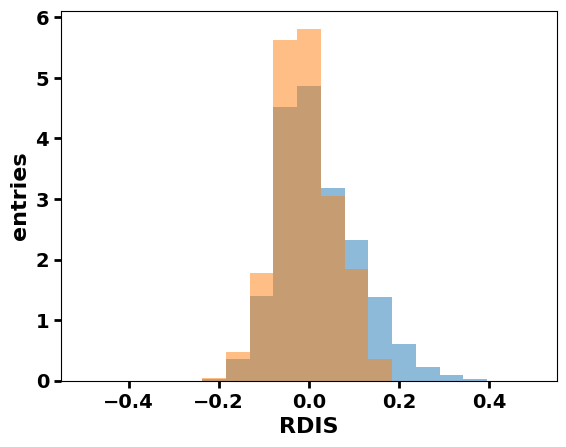

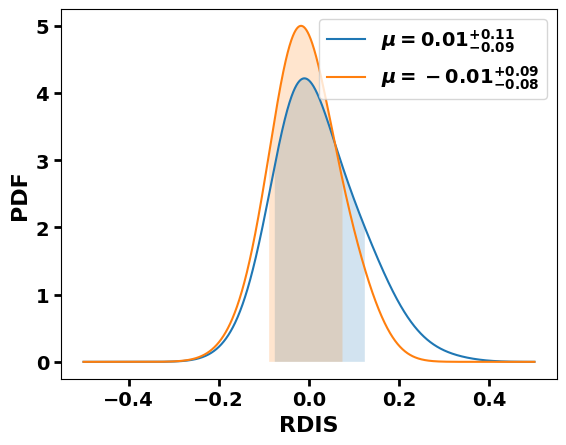

In [33]:
input_data1 = df.ratio.values
input_data2 = df[[False if 'LFSS' in s else True for s in df.label.values]].ratio.values

fig, ax = plt.subplots()
fig.suptitle('')
ax.hist(input_data1, bins=bins, density=True, alpha=0.5)
ax.hist(input_data2, bins=bins, density=True, alpha=0.5)

ax.set_xlabel("RDIS")
ax.set_ylabel("entries")

fig, ax = plt.subplots()
# fig.suptitle('Blue: all models, Red: without LFSS')
ax.set_xlabel('RDIS')
apply_KDE(input_data1, bounds=[bins[0], bins[-1]], data_in_relative_values=True)
apply_KDE(input_data2, bounds=[bins[0], bins[-1]], data_in_relative_values=True)